In [ ]:
# Importing all required libraries

import nltk  # Natural Language Toolkit, used for text processing and analysis
import re  # Regular expression library, for text cleaning
import string  # String library, used for string manipulation tasks
import numpy as np  # NumPy, for numerical operations
import pandas as pd  # Pandas, for data manipulation and analysis

# sklearn libraries for machine learning tasks:
from sklearn.model_selection import train_test_split  # To split the dataset into training and testing sets
from sklearn.feature_extraction.text import TfidfVectorizer  # To convert text data into TF-IDF features
from sklearn.linear_model import PassiveAggressiveClassifier  # For using the Passive-Aggressive Classifier
from sklearn.metrics import accuracy_score, confusion_matrix  # For evaluating the model performance
from sklearn.feature_extraction.text import CountVectorizer  # To convert text data into a matrix of token counts
from sklearn import feature_extraction, linear_model, model_selection, preprocessing  # Various sklearn functionalities
from sklearn.feature_extraction.text import TfidfTransformer  # To transform a count matrix to a normalized tf-idf representation
from sklearn.pipeline import Pipeline  # To assemble several steps that can be cross-validated together
from sklearn.naive_bayes import BernoulliNB  # For using the Bernoulli Naive Bayes classifier
from sklearn.naive_bayes import MultinomialNB  # For using the Multinomial Naive Bayes classifier
from sklearn.tree import DecisionTreeClassifier  # For using the Decision Tree classifier
from sklearn.linear_model import SGDClassifier  # For using the Stochastic Gradient Descent classifier
from sklearn.ensemble import RandomForestClassifier  # For using the Random Forest classifier

# Libraries for data visualization:
import seaborn as sns  # Seaborn, for statistical data visualization
import matplotlib.pyplot as plt  # Matplotlib, for plotting graphs

# NLTK libraries for text processing:
from nltk.stem import PorterStemmer  # For stemming words
from nltk.tokenize import sent_tokenize, word_tokenize  # For tokenizing sentences and words

# Wordcloud library for generating word clouds:
from wordcloud import WordCloud, STOPWORDS  # For creating word clouds


In [ ]:
#Downloading nltk StopWords and Wordnet 
nltk.download('stopwords')
nltk.download('wordnet')

# Dataset1
1.importing 1st dataset
2.EDA on 1st dataset
3.Data pre-processing

In [5]:
Dataset1 = pd.read_csv("news.csv")

In [ ]:
Dataset1.head()

In [7]:
Dataset1.tail()

,Unnamed: 0,title,text,label
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL
6334,4330,Jeb Bush Is Suddenly Attacking Trump. Here's W...,Jeb Bush Is Suddenly Attacking Trump. Here's W...,REAL


In [8]:
Dataset1.nunique()

Unnamed: 0    6335
title         6256
text          6060
label            2
dtype: int64

In [9]:
# Combining the 'title' and 'text' columns to form a new 'Article' column
Dataset1["Article"] = Dataset1["title"] + Dataset1["text"]

# Shuffling the dataset to ensure randomness (helps in training the model later)
Dataset1.sample(frac = 1)  # 'frac=1' means to return all rows (100% of the dataset) in random order

# Converting the labels from 'REAL'/'FAKE' to binary format (1/0) for easier processing
Dataset1.label[Dataset1.label == 'REAL'] = 1  # Convert 'REAL' to 1
Dataset1.label[Dataset1.label == 'FAKE'] = 0  # Convert 'FAKE' to 0

# Selecting only the 'Article' and 'label' columns for further analysis and modeling
Dataset1 = Dataset1.loc[:,['Article','label']]

# Dropping any rows with missing values to maintain data quality
Dataset1 = Dataset1.dropna()  # This ensures the model is trained on complete data only


/Users/chris/PycharmProjects/pythonProject/venv/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Users/chris/PycharmProjects/pythonProject/venv/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In this step we will clean the data that will be used for training. The cleaning will involve these steps-
1.Removing all the extra information like brackets, any kind of puctuations - commas, apostrophes, quotes, question marks, and more.
2.Remove all the numeric text, urls

In [ ]:
def wordpre(text):
    text = text.lower()  # Convert text to lowercase for standardization

    # Remove any text within square brackets (often metadata or footnotes)
    text = re.sub('\[.*?\]', '', text)

    # Remove special characters, leaving only words and numbers
    text = re.sub("\\W"," ",text)  # "\\W" matches any non-alphanumeric character

    # Remove URLs: anything starting with 'http://' or 'https://' followed by non-whitespace
    # or anything starting with 'www.' followed by non-whitespace
    text = re.sub('https?://\S+|www\.\S+', '', text)

    # Remove any HTML or XML tags (like <div>, <a href="...">, etc.)
    text = re.sub('<.*?>+', '', text)

    # Remove punctuation
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)

    # Remove line breaks
    text = re.sub('\n', '', text)

    # Remove words containing numbers
    text = re.sub('\w*\d\w*', '', text)
    
    return text


In [11]:
##  Applying the wordpre method to the dataset
Dataset1['Article']=Dataset1['Article'].apply(wordpre)

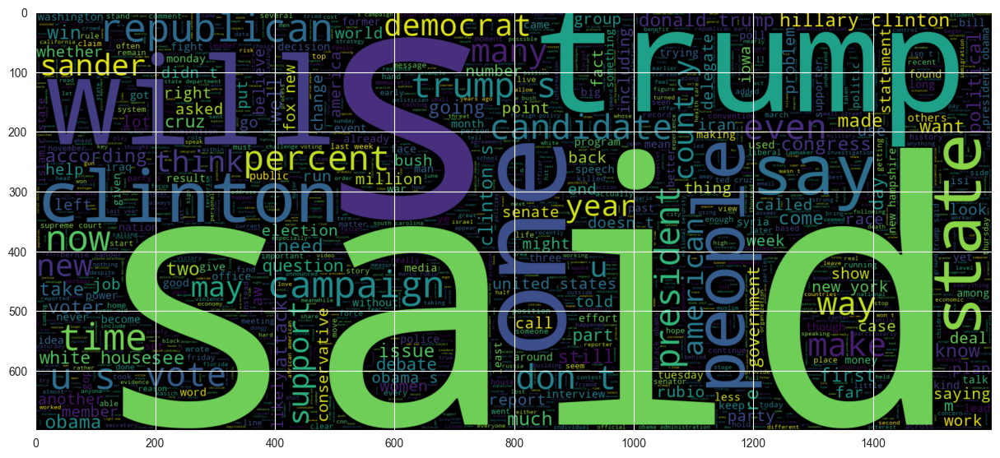

In [12]:
#word used in Real news 
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

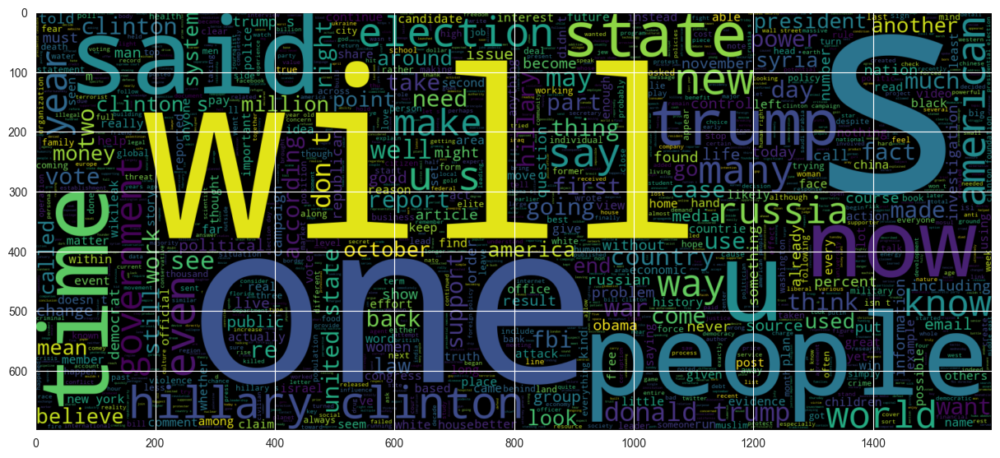

In [13]:
#word used in Fake news 
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset2

In [ ]:
Dataset2_true = pd.read_csv("True.csv")
Dataset2_fake = pd.read_csv("Fake.csv")

In [21]:
# Display unique values count
print(Dataset2_true.nunique())


title      20826
text       21192
subject        2
date         716
dtype: int64
title      17903
text       17455
subject        6
date        1681
dtype: int64


In [22]:
print(Dataset2_fake.nunique())

title      17903
text       17455
subject        6
date        1681
dtype: int64


In [24]:
#Counting by Subjects in Real news
for key, count in Dataset2_true.subject.value_counts().iteritems():
    print(f"{key}:\t{count}")
#Getting Total Rows
print(f"Total Records:\t{Dataset2_true.shape[0]}")

politicsNews:	11272
worldnews:	10145
Total Records:	21417


In [25]:
# Counting by Subjects in Fake News
for key, count in Dataset2_fake.subject.value_counts().iteritems():
    print(f"{key}:\t{count}")

# Total Records in Fake News
print(f"Total Records:\t{Dataset2_fake.shape[0]}")

News:	9050
politics:	6841
left-news:	4459
Government News:	1570
US_News:	783
Middle-east:	778
Total Records:	23481


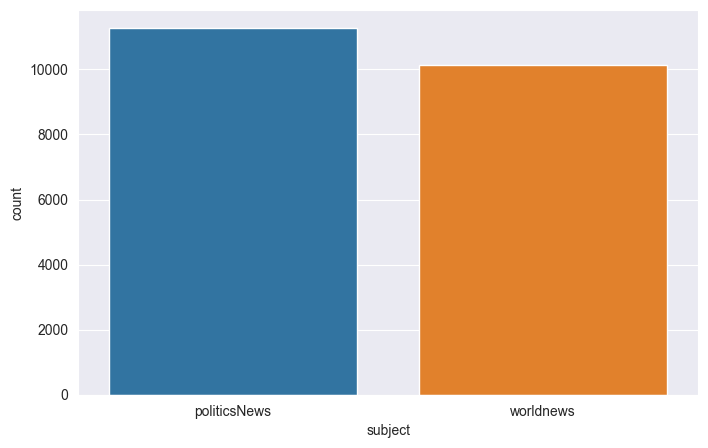

In [26]:
# Plotting the Subjects in Real News
plt.figure(figsize=(8, 5))
sns.countplot(x="subject", data=Dataset2_true)
plt.show()


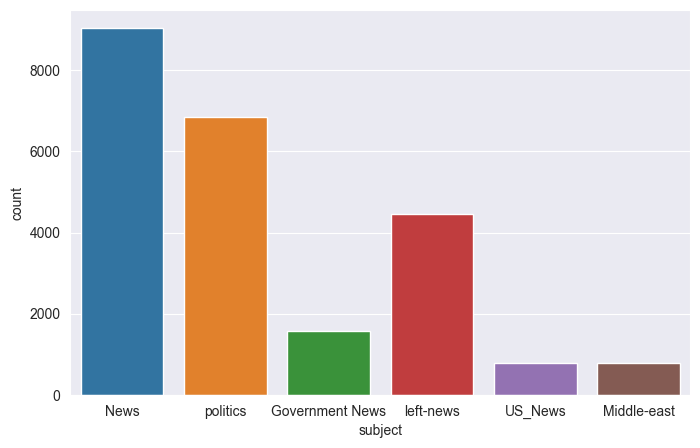

In [27]:
# Plotting the Subjects in Fake News
plt.figure(figsize=(8, 5))
sns.countplot(x="subject", data=Dataset2_fake)
plt.show()

In [28]:
# Assigning labels to the datasets
Dataset2_true['label'] = 1  # Assign a label of 1 to all entries in the true news dataset
Dataset2_fake['label'] = 0  # Assign a label of 0 to all entries in the fake news dataset

# Combining the two datasets into one
Dataset2 = pd.concat([Dataset2_true, Dataset2_fake])  # Concatenate the true and fake news datasets

# Creating a new column 'Article' by concatenating the 'title' and 'text' columns
Dataset2["Article"] = Dataset2["title"] + Dataset2["text"]

# Shuffling the dataset to ensure a mix of true and fake news for unbiased training later
Dataset2.sample(frac = 1)  # 'frac=1' means to shuffle and return all rows (100% of the dataset)

# Selecting only the 'Article' and 'label' columns for further analysis
Dataset2 = Dataset2.loc[:,['Article','label']]  # This helps focus on the text and its corresponding label


In [29]:
Dataset2

,Article,label
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1
...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,0
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
23479,How to Blow $700 Million: Al Jazeera America F...,0


In [30]:
##  Applying the wordpre method to the dataset
Dataset2['Article']=Dataset2['Article'].apply(wordpre)

In [31]:
Dataset2.head()

,Article,label
0,as u s budget fight looms republicans flip t...,1
1,u s military to accept transgender recruits o...,1
2,senior u s republican senator let mr muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much mor...,1


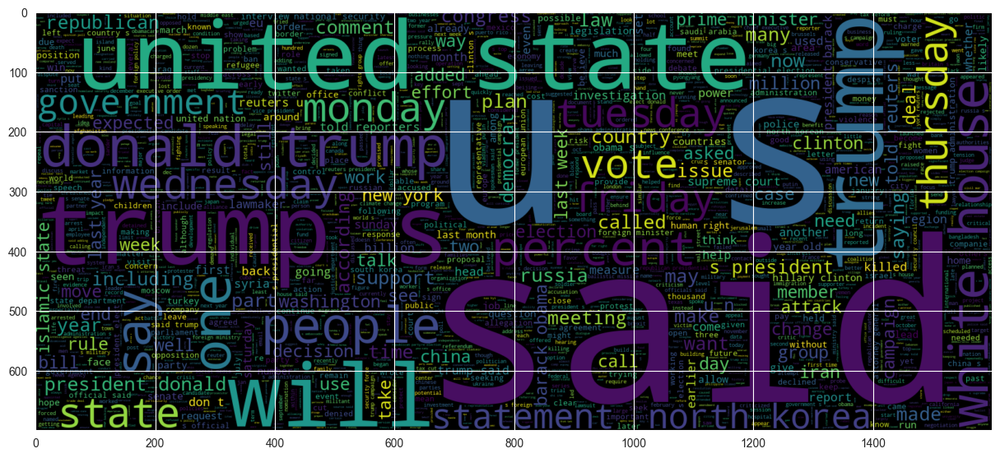

In [32]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

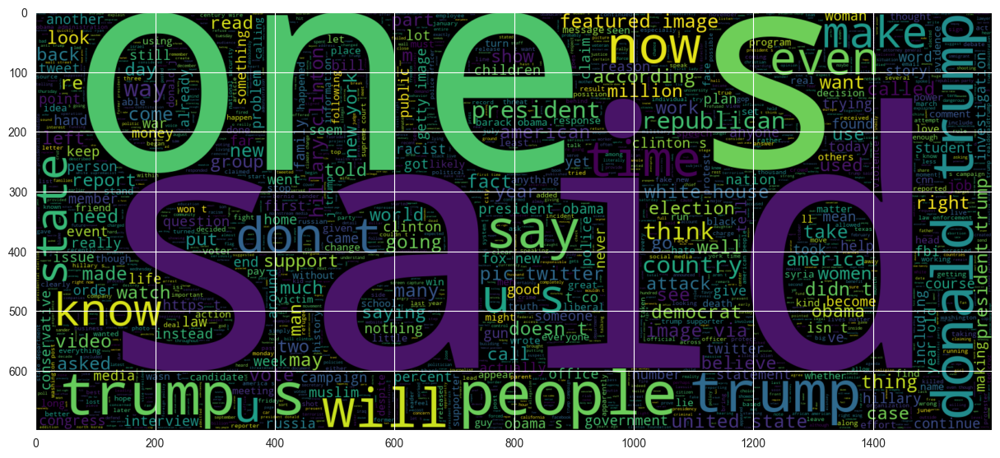

In [33]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 3

In [34]:
Dataset3_real = pd.read_csv("politifact_real.csv")
Dataset3_fake = pd.read_csv("politifact_fake.csv")

In [35]:
Dataset3_real['label']= 1
Dataset3_fake['label']= 0
Dataset3 = pd.concat([Dataset3_real, Dataset3_fake])
Dataset3["Article"] = Dataset3["title"]
Dataset3.sample(frac = 1) #Shuffle 100%
Dataset3 = Dataset3.loc[:,['Article','label']]

In [36]:
Dataset3

,Article,label
0,National Federation of Independent Business,1
1,comments in Fayetteville NC,1
2,"Romney makes pitch, hoping to close deal : Ele...",1
3,Democratic Leaders Say House Democrats Are Uni...,1
4,"Budget of the United States Government, FY 2008",1
...,...,...
427,Who is affected by the government shutdown?,0
428,Lindsey Graham Threatens To Convert To Democra...,0
429,ELECTORAL COLLEGE ELECTOR COMMITS SUICIDE TO A...,0
430,Sarah Palin Calls To Boycott Mall Of America B...,0


In [37]:
##  Applying the wordpre method to the dataset
Dataset3['Article']=Dataset3['Article'].apply(wordpre)

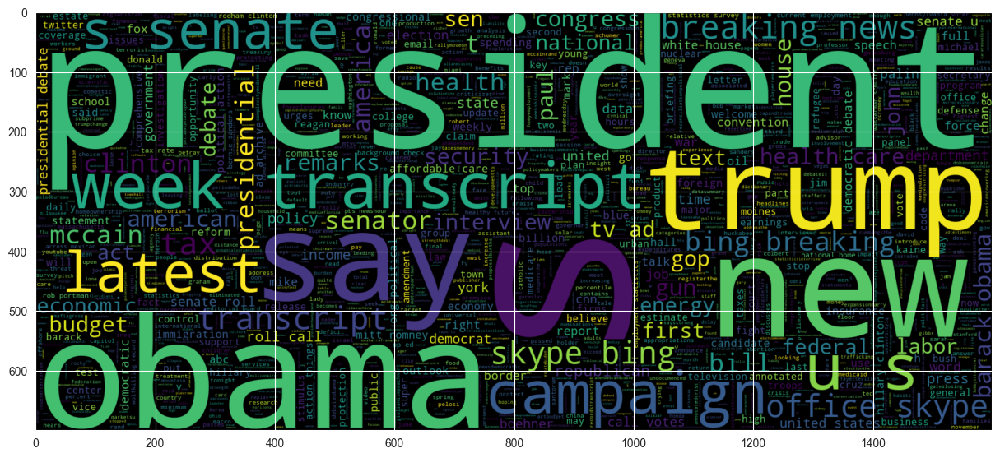

In [38]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

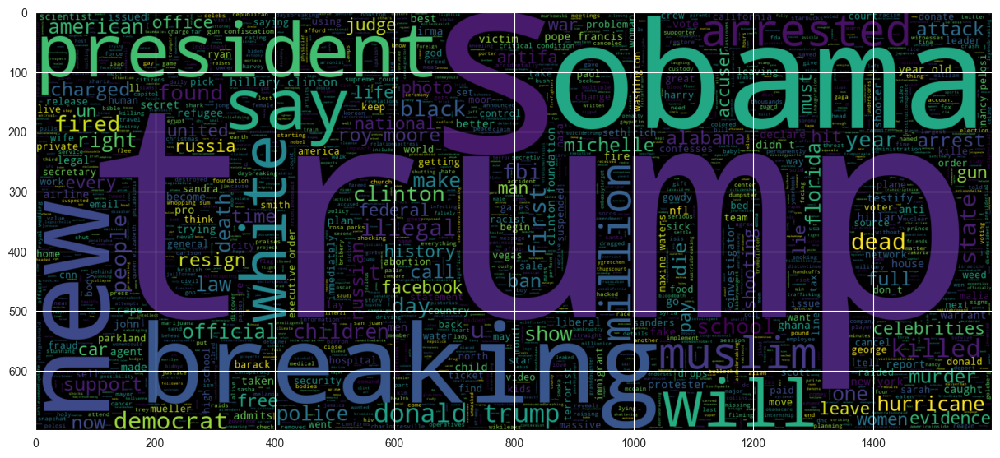

In [39]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 4

In [40]:
Dataset4 = pd.read_csv("train.csv")

In [41]:
Dataset4.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [42]:
Dataset4["Article"] = Dataset4["title"] + Dataset4["text"]
Dataset4.sample(frac = 1) #Shuffle 100%

Dataset4 = Dataset4.loc[:,['Article','label']]
Dataset4 = Dataset4.dropna()

In [43]:
##  Applying the wordpre method to the dataset
Dataset4['Article']=Dataset4['Article'].apply(wordpre)

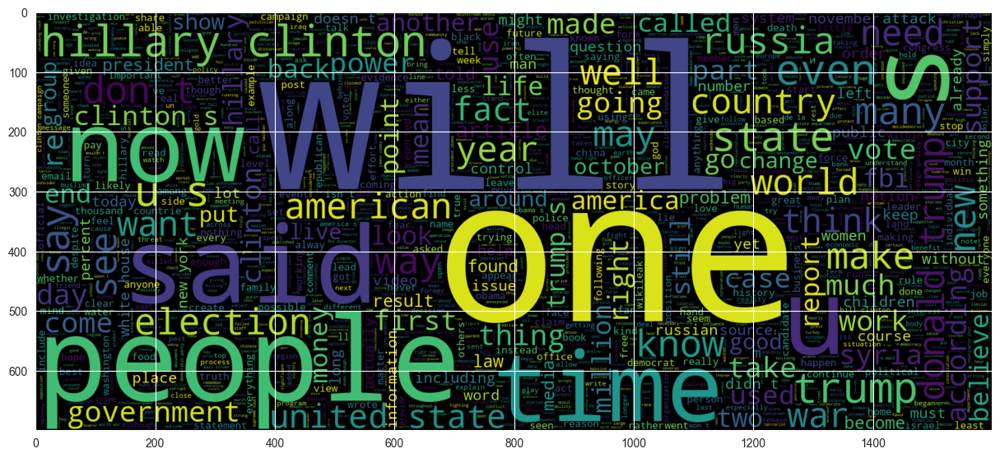

In [44]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

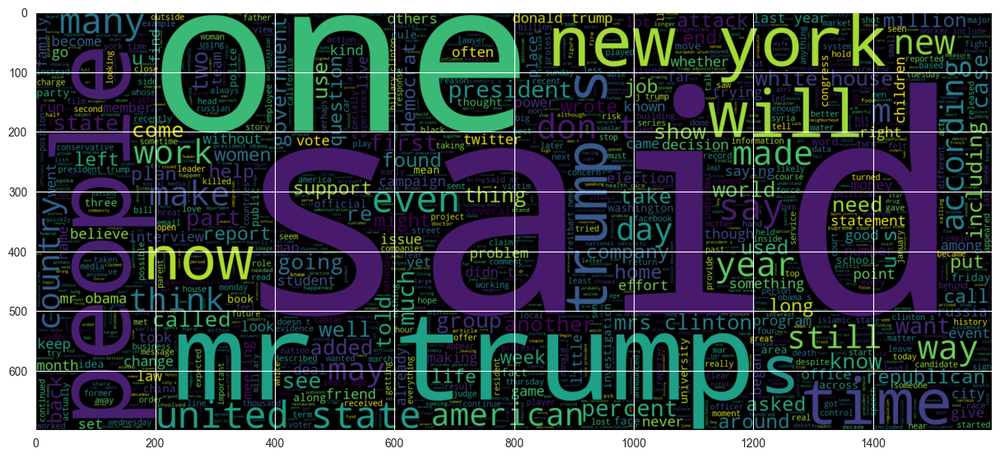

In [76]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 0].Article))
plt.imshow(wc, interpolation="bilinear") 

# Dataset 5

In [46]:
Dataset5 = pd.read_csv("data.csv")

In [47]:
Dataset5

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\nOn Sunday mornin...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1
...,...,...,...,...
4004,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch\n% of readers think this story...,0
4005,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,0
4006,https://www.activistpost.com/2017/09/ron-paul-...,"Ron Paul on Trump, Anarchism & the AltRight",NaN,0
4007,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) - China said it plans to ac...,1


In [48]:
Dataset5["Article"] = Dataset5["Headline"] + Dataset5["Body"]
Dataset5["label"] = Dataset5["Label"]
Dataset5.sample(frac = 1) #Shuffle 100%
Dataset5 = Dataset5.loc[:,['Article','label']]
Dataset5 = Dataset5.dropna()

In [49]:
##  Applying the wordpre method to the dataset
Dataset5['Article']=Dataset5['Article'].apply(wordpre)

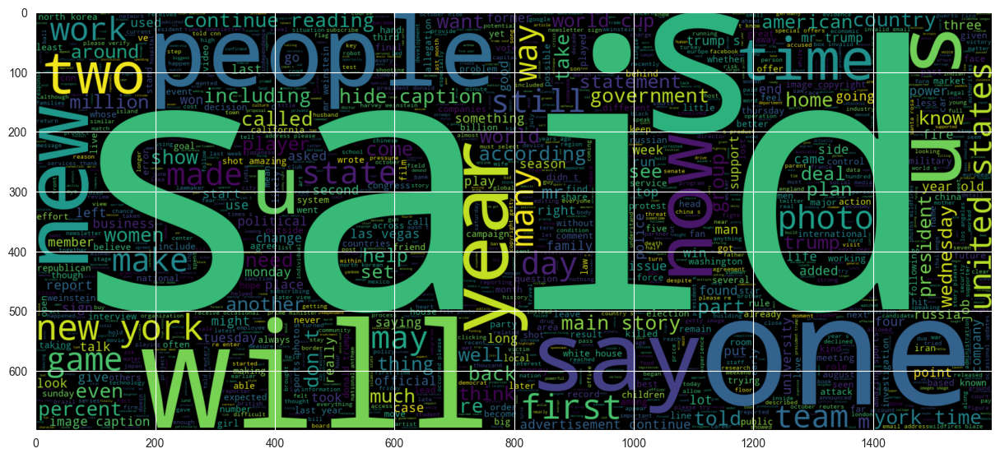

In [50]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

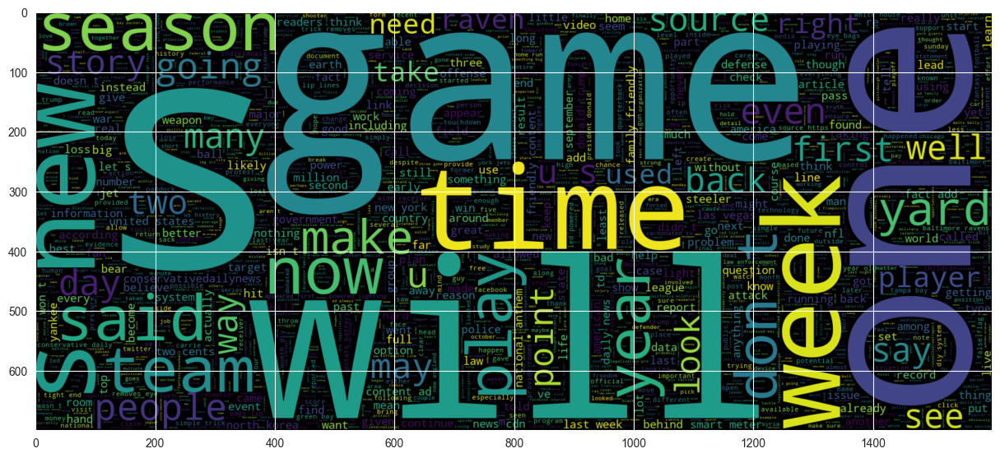

In [51]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

In [52]:
#combining all the datset into one
frames = [Dataset1, Dataset2, Dataset3, Dataset4,Dataset5]
Dataset = pd.concat(frames)

In [53]:
Dataset.shape

(76480, 2)

In [54]:
# Splitting the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(Dataset['Article'], Dataset['label'], test_size=0.2, random_state=2020)

In [55]:
x_train.shape

(61184,)

In [56]:
x_test.shape

(15296,)

In [57]:
# Converting the labels in the training and testing sets to integers
y_train = y_train.astype('int')  # Convert y_train labels to integers
y_test = y_test.astype('int')    # Convert y_test labels to integers


In [ ]:
# Logistic Regression is chosen for the following reasons:
# 1. Binary Classification: Logistic Regression is well-suited for binary classification problems. 
#    In this case, it's used to differentiate between 'real' and 'fake' news, which are two distinct categories.
# 2. Interpretability: Unlike more complex models, logistic regression provides interpretable results.
#    The coefficients of the model can be directly related to the influence of each feature, making it easier to understand.
# 3. Efficiency: Logistic Regression tends to be computationally less intensive, which makes it a good choice for 
#    relatively large datasets or when a simpler model is sufficient for achieving good results.
# 4. Baseline Model: It's often used as a baseline in text classification tasks. Due to its simplicity and often 
#    competitive performance, it's a good starting point before trying more complex algorithms.
# 5. Good Performance with Text Data: When combined with techniques like TF-IDF, Logistic Regression can 
#    perform quite well on text data, capturing linear relationships between the features (words) and the target variable.

In [62]:
# Import necessary libraries for the pipeline, feature extraction, model, and evaluation
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Setting up a machine learning pipeline
pipe = Pipeline([
    ('vect', CountVectorizer()),   # Step 1: Convert text to a matrix of token counts
    ('tfidf', TfidfTransformer()), # Step 2: Transform the count matrix to a normalized tf-idf representation
    ('model', LogisticRegression()) # Step 3: Apply a Logistic Regression classifier
])

# Training the model using the pipeline
Logisticmodel = pipe.fit(x_train, y_train)

# Making predictions on the test set
prediction = Logisticmodel.predict(x_test)

# Evaluating and printing the accuracy of the model
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Logisticmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)


accuracy: 87.04%


In [ ]:
# Decision Tree Classifier is chosen for the following reasons:
# 1. Non-Linear Relationships: Unlike Logistic Regression, Decision Trees can capture non-linear relationships 
#    between features and the target variable. This can be particularly useful if the relationship between words 
#    (features) and the news category (real or fake) is complex.
# 2. Interpretability: Decision Trees are relatively interpretable - they provide a clear indication of which features 
#    (words) are most important in determining the classification. This can be useful for understanding the model's decisions.
# 3. Hyperparameter Tuning: In this implementation, specific hyperparameters like 'criterion', 'max_depth', and 
#    'splitter' are set. These allow for customization of the tree's structure and can help in preventing overfitting 
#    (e.g., through 'max_depth') or in defining how to split nodes ('criterion' and 'splitter').
# 4. Versatility: Decision Trees can handle both numerical and categorical data and are robust to outliers, 
#    making them a versatile choice for various types of datasets.
# 5. Ensemble Methods: Decision Trees form the basis for more advanced ensemble methods like Random Forests 
#    and Gradient Boosting Machines. Starting with a Decision Tree helps in understanding these more complex models.

# The model is trained on the training data and evaluated on the test data using accuracy as the metric. 
# Accuracy is a straightforward metric for evaluating classification models, showing the percentage of correct predictions.

In [63]:
#####DecisionTreeClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = 10, 
                                           splitter='best', 
                                           random_state=2020))])
DecisionTreemodel = pipe.fit(x_train, y_train)
prediction = DecisionTreemodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
DecisionTreemodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 82.07%


In [ ]:
# RandomForestClassifier is chosen for the following reasons:
# 1. Ensemble Learning: RandomForest is an ensemble learning method, which means it combines the predictions from 
#    multiple decision trees to produce a more robust and accurate model. This generally leads to better performance 
#    compared to using a single decision tree.
# 2. Handling Overfitting: While individual decision trees can easily overfit, the random forest algorithm tends to 
#    reduce overfitting by averaging the results of many trees. This makes it more reliable for practical use.
# 3. Feature Importance: Like decision trees, random forests also provide insights into the importance of different 
#    features (words) in making predictions. This is valuable for interpreting the model's behavior.
# 4. Flexibility and No Need for Feature Scaling: Random forests can handle both categorical and numerical data and 
#    do not require feature scaling. This makes them very versatile and easy to use in many scenarios.
# 5. Good Performance with Default Parameters: Random forests often perform well with their default parameters, 
#    making them a good starting point for model development without the need for extensive parameter tuning.

# The model is trained on the training data and evaluated on the test data. 
# The accuracy metric is used to assess the performance, showing the percentage of correct predictions.

In [65]:
#####RandomForestClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', RandomForestClassifier())])

RandomForestmodel = pipe.fit(x_train, y_train) 
prediction = RandomForestmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
RandomForestmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 82.09%


In [ ]:
# SGDClassifier is chosen for the following reasons:
# 1. Efficiency: SGDClassifier is efficient for large-scale and high-dimensional data. 
#    It's particularly useful in text classification tasks where the dataset can be quite large.
# 2. Flexibility: SGDClassifier allows different loss functions and penalties, making it adaptable to various problems, 
#    including logistic regression, linear support vector machines, etc.
# 3. Handling Sparse Data: It works well with sparse data, which is common in text processing (e.g., with TF-IDF representation).
# 4. Scalability: The stochastic gradient descent approach updates the model incrementally, 
#    making it suitable for online learning and large datasets.
# 5. Regularization: The model includes built-in regularization capabilities, which can help prevent overfitting 
#    and improve model generalization.

# The pipeline is set up with CountVectorizer for tokenization, TfidfTransformer for text normalization, 
# and SGDClassifier for the classification task. The model is trained on the training data and evaluated on the test data. 
# Accuracy is used as the metric, providing a percentage of correctly predicted instances.

In [67]:
#Stochastic Gradient Descent
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', SGDClassifier())])
SGDmodel = pipe.fit(x_train, y_train)
prediction = SGDmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
SDGmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 86.26%


In [ ]:
# GradientBoostingClassifier is chosen for the following reasons:
# 1. Boosting Technique: Gradient Boosting is a boosting technique that builds a model from 
#    weak learners (decision trees) in a stage-wise fashion. It optimizes for a loss function, making it 
#    a powerful approach for classification tasks.
# 2. Handling Complex Patterns: It can handle complex data patterns and interactions, 
#    which might be present in text data when differentiating between real and fake news.
# 3. Configurable Hyperparameters: The ability to configure its hyperparameters like 'loss', 'learning_rate', 
#    'n_estimators', and 'max_depth' allows fine-tuning the model for better performance. 
#    This includes controlling the speed of learning and the complexity of the trees.
# 4. Avoidance of Overfitting: Setting a small learning rate and the number of estimators can help 
#    in avoiding overfitting, as the model learns gradually.
# 5. Good Generalization: Gradient Boosting often provides good generalization on datasets, 
#    making it suitable for scenarios where predictive performance is crucial.

# The pipeline incorporates CountVectorizer for tokenization, TfidfTransformer for normalization, 
# and GradientBoostingClassifier for the main learning algorithm. The model is trained on the training set 
# and its accuracy is evaluated on the test set, reflecting the percentage of correctly classified instances.

In [68]:
#GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', GradientBoostingClassifier(loss = 'deviance',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=55))])

GBCmodel = pipe.fit(x_train, y_train)
prediction = GBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
GBCmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 80.71%


In [ ]:
# XGBClassifier is chosen for the following reasons:
# 1. Advanced Boosting Algorithm: XGBoost (eXtreme Gradient Boosting) is an advanced implementation of gradient boosting.
#    It is known for its efficiency, performance, and speed in classification tasks.
# 2. Handling Large and Complex Datasets: XGBoost performs exceptionally well with large and complex datasets, 
#    making it suitable for text classification where datasets often have high dimensionality.
# 3. Regularization: XGBoost includes L1 and L2 regularization which helps in reducing overfitting and improving model performance.
# 4. Scalability: XGBoost is designed to be highly scalable and faster than other gradient boosting techniques, 
#    which is beneficial for handling large amounts of text data.
# 5. Hyperparameter Tuning: XGBoost provides various hyperparameters like 'loss', 'learning_rate', 'n_estimators', and 
#    'max_depth' that can be fine-tuned for better model accuracy and to control the complexity of the model.

In [72]:
#########XGBClassifier
from xgboost import XGBClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', XGBClassifier(loss = 'deviance',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=2020))])

xgboostmodel = pipe.fit(x_train, y_train)
prediction = xgboostmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
xgboostmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

[00:21:36] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-37/xgboost/src/learner.cc:627: 
Parameters: { "loss" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.

accuracy: 80.75%


In [70]:
#######Multinomial Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB())])

MNBCmodel = pipe.fit(x_train, y_train)
prediction = MNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Multinomial_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 78.79%


In [ ]:
# Multinomial Naive Bayes Classifier is chosen for the following reasons:
# 1. Suitability for Text Data: Multinomial Naive Bayes is particularly effective for classification with discrete features 
#    (e.g., word counts for text classification). It performs well on large datasets and is widely used in text classification tasks.
# 2. Probabilistic Approach: It works on the principle of Bayes' theorem with the assumption of independence between features. 
#    This probabilistic approach is efficient in handling text data where the frequency of words can be a good indicator of the class.
# 3. Simplicity and Speed: The algorithm is simple to understand and quick to implement, making it a great starting point 
#    for text classification problems. It's also computationally efficient, even with large datasets.
# 4. Good Baseline Model: Due to its simplicity and surprisingly good performance, it often serves as a solid baseline 
#    against which more complex models can be compared.
# 5. Effective with High Dimensionality: In text data, where the feature space can be large (large vocabulary), 
#    Multinomial Naive Bayes works effectively without needing extensive computation.

In [71]:
#############Bernoulli Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', BernoulliNB())])

BNBCmodel = pipe.fit(x_train, y_train)
prediction = BNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Bernoulli_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 76.08%


In [ ]:
# Bernoulli Naive Bayes Classifier is chosen for the following reasons:
# 1. Binary Feature Suitability: Bernoulli Naive Bayes is specifically designed for binary/boolean features. 
#    In text classification tasks, it works well with data that is transformed into binary term occurrence features 
#    (e.g., whether a word occurs in a document or not), which can be effectively handled by CountVectorizer followed by TfidfTransformer.
# 2. Probabilistic Model: Similar to Multinomial Naive Bayes, it's based on Bayes' theorem with independence assumptions between features. 
#    This makes it suitable for datasets where the presence or absence of a feature is more informative than its frequency.
# 3. Simplicity and Efficiency: Bernoulli Naive Bayes is easy to implement and understand. It's computationally efficient, 
#    even with large datasets, which is beneficial for processing large volumes of text data.
# 4. Good Baseline for Text Classification: Due to its simplicity and decent performance in binary classification tasks, 
#    it serves as a good baseline model for text classification problems.
# 5. Robust to Irrelevant Features: It can perform well even if some features are not relevant, making it robust 
#    for real-world text data where not all terms might be significant for the classification task.


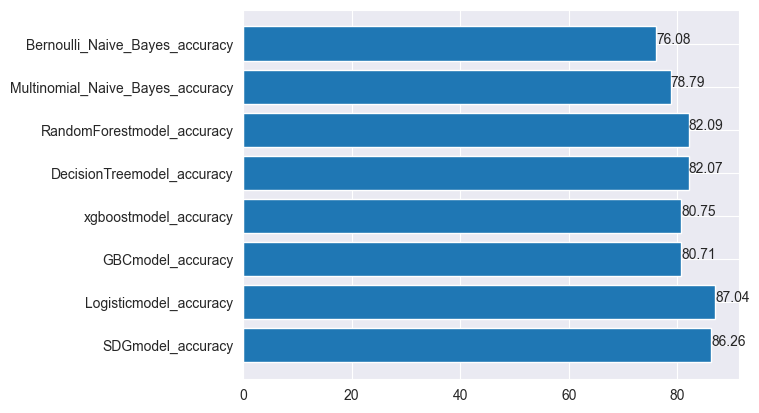

In [74]:
x = ["SDGmodel_accuracy", "Logisticmodel_accuracy", "GBCmodel_accuracy", "xgboostmodel_accuracy" , 
     "DecisionTreemodel_accuracy","RandomForestmodel_accuracy","Multinomial_Naive_Bayes_accuracy",
     "Bernoulli_Naive_Bayes_accuracy"]
y =  [SDGmodel_accuracy,Logisticmodel_accuracy,GBCmodel_accuracy,xgboostmodel_accuracy,
      DecisionTreemodel_accuracy,RandomForestmodel_accuracy,Multinomial_Naive_Bayes_accuracy,
      Bernoulli_Naive_Bayes_accuracy]
plt.barh(x, y)

for index, value in enumerate(y):
    plt.text(value, index, str(value))

In [75]:
import joblib  
# Save the model as a pickle in a file 
joblib.dump(Logisticmodel, 'model.pkl')  

['model.pkl']